In [1]:
import os
import cv2
import json
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import GRU, Dense, Embedding
from tensorflow.keras.models import Sequential


In [2]:
train_sample_folder =  ("C:/Users/pc/Desktop/train_sample_videos")
test_folder =  ("C:/Users/pc/Desktop/test_videos")
 

In [3]:
train_sample_files  = os.listdir(train_sample_folder)
train_sample_file_count = len(train_sample_files)
print(f"Number of files in train sample folder: {train_sample_file_count}")

test_files = os.listdir(test_folder)
test_file_count = len(test_files)
print(f"Number of files in test folder: {test_file_count}")


Number of files in train sample folder: 401
Number of files in test folder: 400


In [4]:
train_metadata = pd.read_json("C:/Users/pc/Desktop/meta/metadata.json").T
train_metadata

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4
...,...,...,...
etejaapnxh.mp4,FAKE,train,wtreibcmgm.mp4
etmcruaihe.mp4,FAKE,train,afoovlsmtx.mp4
etohcvnzbj.mp4,FAKE,train,bdnaqemxmr.mp4
eudeqjhdfd.mp4,REAL,train,None


In [5]:
train_metadata.shape

(400, 3)

In [6]:
ftrain_sample_video = list(train_metadata.loc[train_metadata.label=='FAKE'].sample(7).index)
ftrain_sample_video

['diopzaywor.mp4',
 'dlrsbscitn.mp4',
 'ctpqeykqdp.mp4',
 'bhbdugnurr.mp4',
 'ddqccgmtka.mp4',
 'efdyrflcpg.mp4',
 'erqgqacbqe.mp4']

In [7]:
def capture_image_from_video(video_path):
    capture_image = cv2.VideoCapture(video_path)
    ret, frame = capture_image.read()
    fig = plt.figure(figsize =(10,10))
    ax = fig.add_subplot(111)
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    ax.imshow(frame)

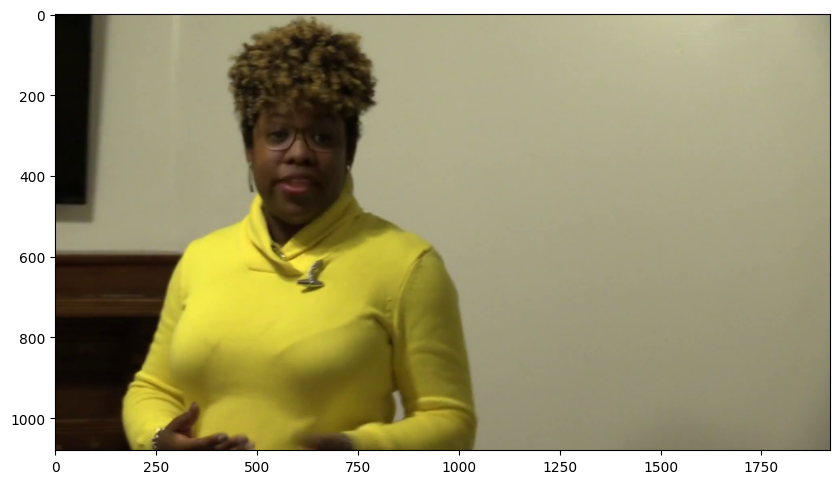

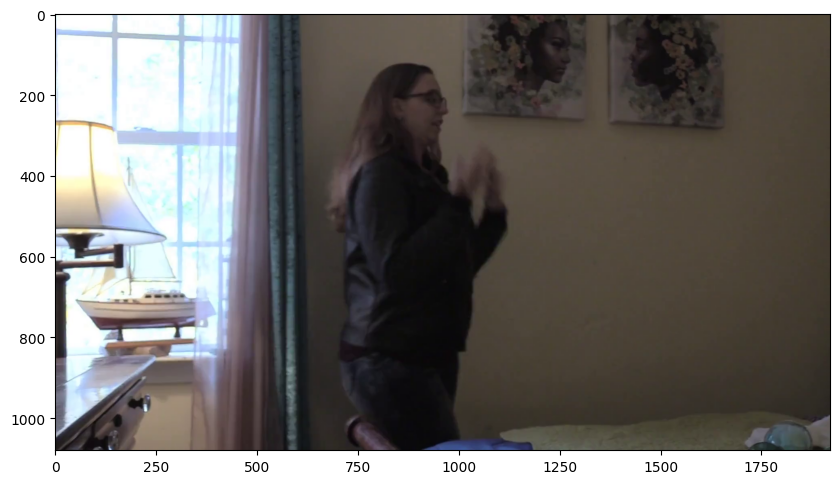

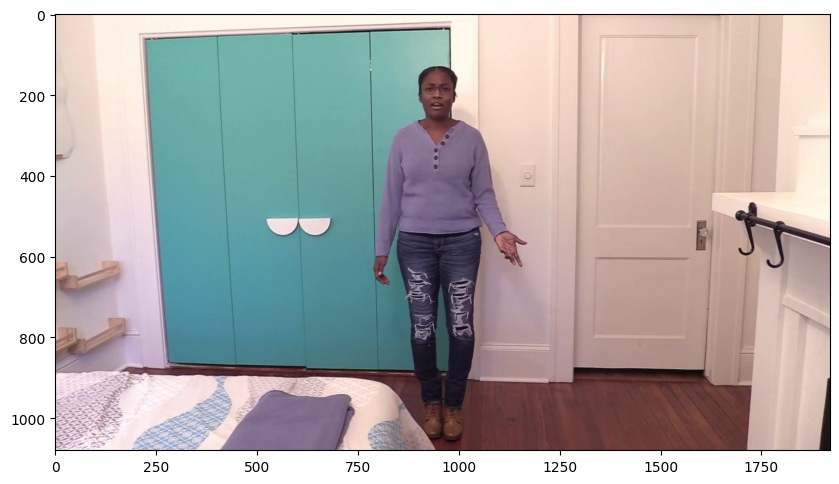

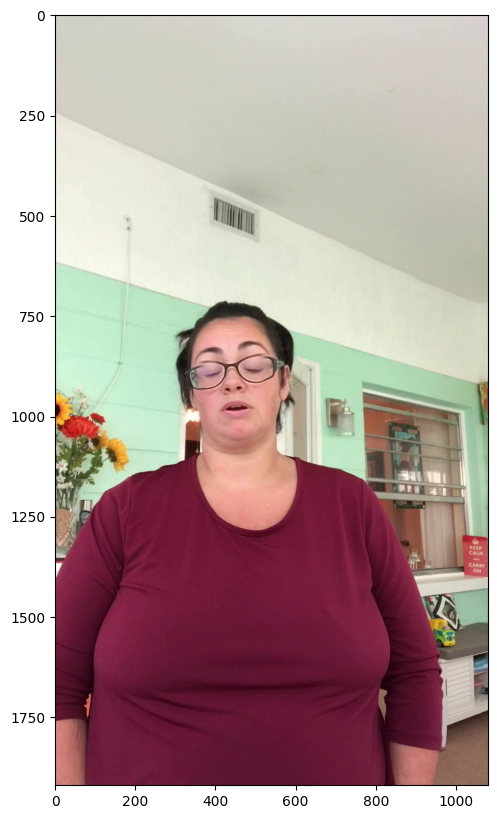

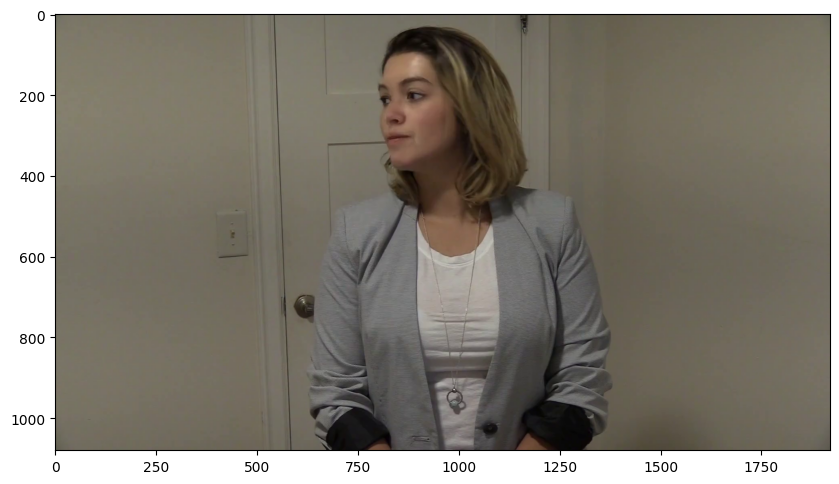

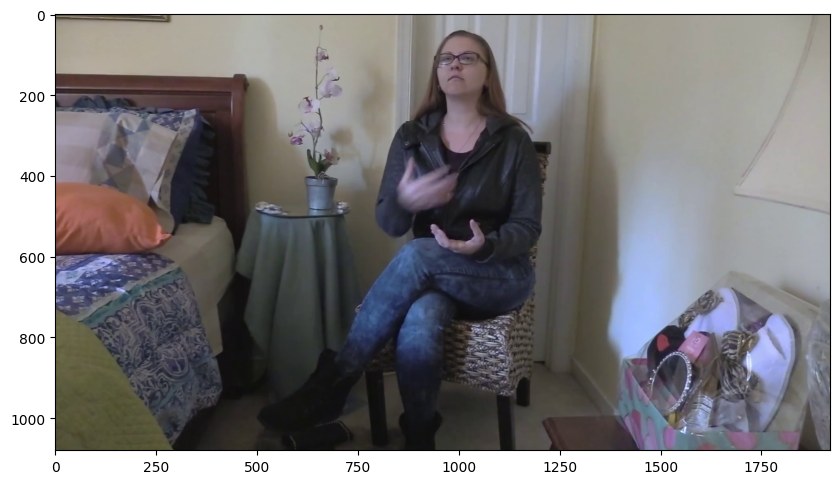

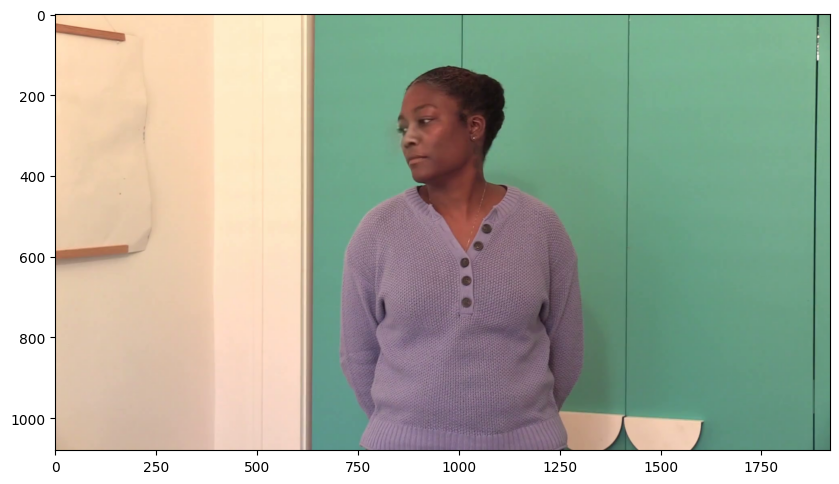

In [8]:
for video_file in ftrain_sample_video:
    capture_image_from_video(os.path.join(train_sample_folder, video_file))
    

In [9]:
#FAKE VIDEO FILES
f_videos = list(train_metadata.loc[train_metadata.label=='FAKE'].index)
f_videos

['aagfhgtpmv.mp4',
 'aapnvogymq.mp4',
 'abofeumbvv.mp4',
 'abqwwspghj.mp4',
 'acifjvzvpm.mp4',
 'acqfdwsrhi.mp4',
 'acxnxvbsxk.mp4',
 'acxwigylke.mp4',
 'aczrgyricp.mp4',
 'adhsbajydo.mp4',
 'adohikbdaz.mp4',
 'adylbeequz.mp4',
 'aelzhcnwgf.mp4',
 'aettqgevhz.mp4',
 'aevrfsexku.mp4',
 'agdkmztvby.mp4',
 'agqphdxmwt.mp4',
 'ahbweevwpv.mp4',
 'ahdbuwqxit.mp4',
 'ahfazfbntc.mp4',
 'aipfdnwpoo.mp4',
 'ajwpjhrbcv.mp4',
 'aklqzsddfl.mp4',
 'aknbdpmgua.mp4',
 'aknmpoonls.mp4',
 'akvmwkdyuv.mp4',
 'akxoopqjqz.mp4',
 'akzbnazxtz.mp4',
 'aladcziidp.mp4',
 'alaijyygdv.mp4',
 'alninxcyhg.mp4',
 'altziddtxi.mp4',
 'alvgwypubw.mp4',
 'amaivqofda.mp4',
 'amowujxmzc.mp4',
 'andaxzscny.mp4',
 'aneclqfpbt.mp4',
 'aorjvbyxhw.mp4',
 'apatcsqejh.mp4',
 'apgjqzkoma.mp4',
 'apogckdfrz.mp4',
 'aqpnvjhuzw.mp4',
 'arkroixhey.mp4',
 'arlmiizoob.mp4',
 'arrhsnjqku.mp4',
 'asdpeebotb.mp4',
 'aslsvlvpth.mp4',
 'asmpfjfzif.mp4',
 'asvcrfdpnq.mp4',
 'atxvxouljq.mp4',
 'atyntldecu.mp4',
 'atzdznmder.mp4',
 'aufmsmnoye

In [10]:
#NUMBER OF FAKE VIDEOS
f_videos = len(list(train_metadata.loc[train_metadata.label=='FAKE'].index))
f_videos

323

In [11]:
#REAL VIDEO FILES
R_videos = list(train_metadata.loc[train_metadata.label=='REAL'].index)
R_videos

['abarnvbtwb.mp4',
 'aelfnikyqj.mp4',
 'afoovlsmtx.mp4',
 'agrmhtjdlk.mp4',
 'ahqqqilsxt.mp4',
 'ajqslcypsw.mp4',
 'anpuvshzoo.mp4',
 'asaxgevnnp.mp4',
 'atkdltyyen.mp4',
 'atvmxvwyns.mp4',
 'avmjormvsx.mp4',
 'axntxmycwd.mp4',
 'aybgughjxh.mp4',
 'aybumesmpk.mp4',
 'aytzyidmgs.mp4',
 'bddjdhzfze.mp4',
 'bdnaqemxmr.mp4',
 'beboztfcme.mp4',
 'bejhvclboh.mp4',
 'beyebyhrph.mp4',
 'bffwsjxghk.mp4',
 'bgvhtpzknn.mp4',
 'bgwmmujlmc.mp4',
 'bilnggbxgu.mp4',
 'bmjzrlszhi.mp4',
 'bpapbctoao.mp4',
 'brwrlczjvi.mp4',
 'bulkxhhknf.mp4',
 'bwhlgysghg.mp4',
 'bwipwzzxxu.mp4',
 'bxzakyopjf.mp4',
 'bzythlfnhq.mp4',
 'caifxvsozs.mp4',
 'ccfoszqabv.mp4',
 'cfxkpiweqt.mp4',
 'chtapglbcj.mp4',
 'chviwxsfhg.mp4',
 'ciyoudyhly.mp4',
 'cizlkenljw.mp4',
 'ckjaibzfxa.mp4',
 'ckkuyewywx.mp4',
 'clrycekyst.mp4',
 'cmbzllswnl.mp4',
 'cobjrlugvp.mp4',
 'cpjxareypw.mp4',
 'cppdvdejkc.mp4',
 'cprhtltsjp.mp4',
 'crezycjqyk.mp4',
 'cyxlcuyznd.mp4',
 'dakiztgtnw.mp4',
 'dbnygxtwek.mp4',
 'dbtbbhakdv.mp4',
 'ddepeddixj

In [12]:
#NUMBER OF REAL VIDEOS
R_videos = len(list(train_metadata.loc[train_metadata.label=='REAL'].index))
R_videos

77

In [13]:
Rtrain_sample_video = list(train_metadata.loc[train_metadata.label=='REAL'].sample(3).index)
Rtrain_sample_video

['bpapbctoao.mp4', 'abarnvbtwb.mp4', 'avmjormvsx.mp4']

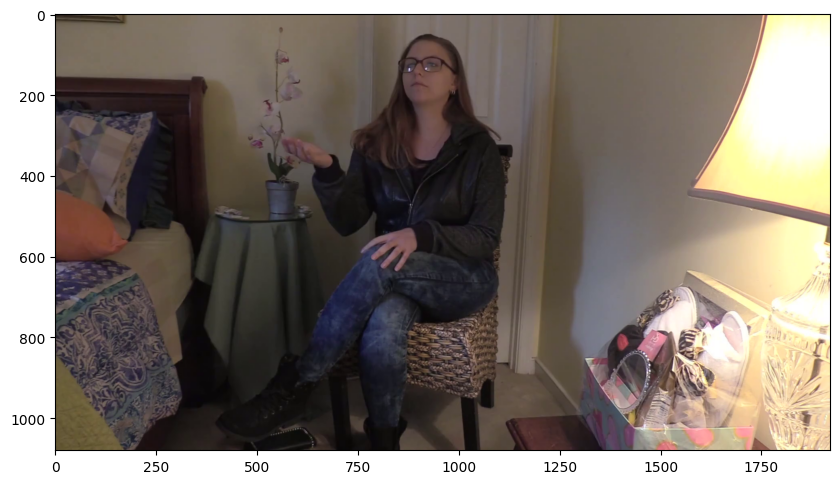

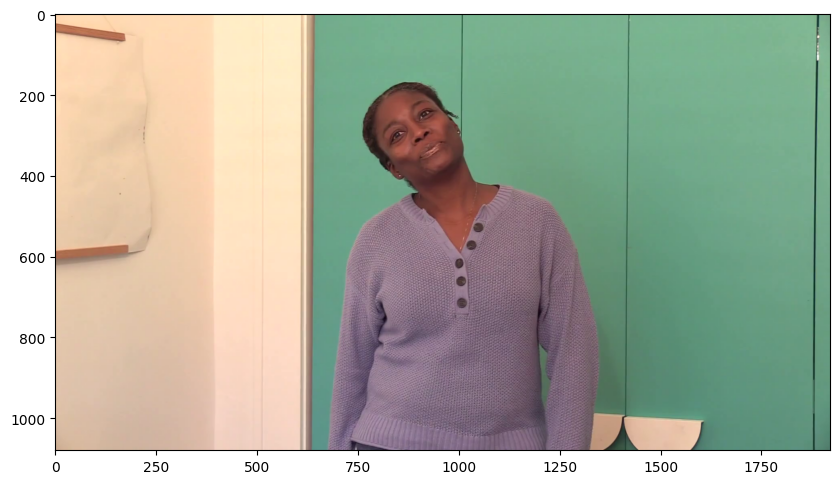

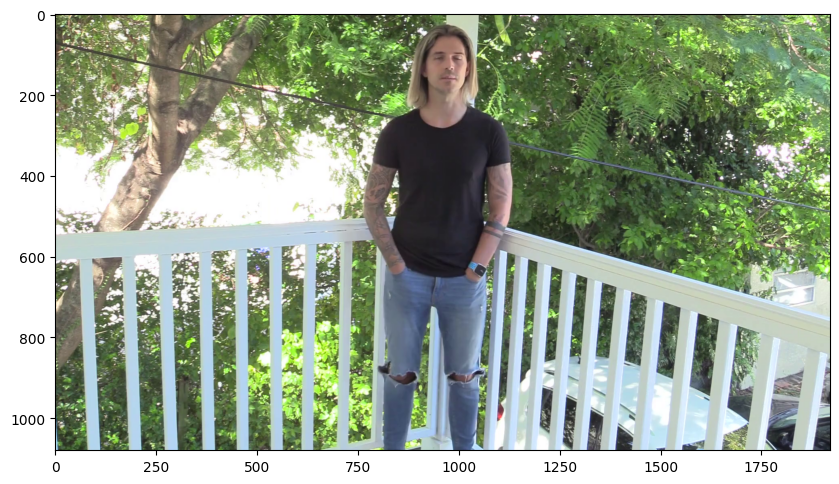

In [14]:
for video_file in Rtrain_sample_video:
    capture_image_from_video(os.path.join(train_sample_folder,video_file))



In [15]:
from IPython.display import HTML
from base64 import b64encode

def play_video(video_file):
    video_url = open(video_file, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(video_url).decode()
    return HTML("""<video width=500 controls><source src="%s" type="video/mp4"></video>""" %data_url)


In [16]:
play_video(os.path.join(train_sample_folder, train_sample_files[128]))


In [17]:
import cv2

def extract_frames(video_path, num_frames=10, interval_sec=1):
    frames = []
    capture = cv2.VideoCapture(video_path)
    frame_rate = capture.get(cv2.CAP_PROP_FPS)
    frame_count = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))
    interval_frame = int(frame_rate * interval_sec)
    for i in range(num_frames):
        frame_num = int(i * (frame_count - 1) / (num_frames - 1))
        capture.set(cv2.CAP_PROP_POS_FRAMES, frame_num)
        ret, frame = capture.read()
        if ret:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
    capture.release()
    return frames


In [18]:
video_path = os.path.join(train_sample_folder, train_sample_files[10])
frames = extract_frames(video_path, num_frames=10)
frames

[array([[[248, 228, 198],
         [248, 228, 198],
         [248, 228, 198],
         ...,
         [253, 243, 219],
         [253, 243, 219],
         [253, 243, 219]],
 
        [[248, 228, 198],
         [248, 228, 198],
         [248, 228, 198],
         ...,
         [253, 243, 219],
         [253, 243, 219],
         [253, 243, 219]],
 
        [[248, 228, 198],
         [248, 228, 198],
         [248, 228, 198],
         ...,
         [254, 244, 220],
         [253, 243, 219],
         [253, 243, 219]],
 
        ...,
 
        [[196, 149, 115],
         [203, 156, 122],
         [206, 157, 121],
         ...,
         [213, 194, 182],
         [214, 195, 183],
         [214, 195, 183]],
 
        [[203, 154, 116],
         [211, 162, 124],
         [211, 162, 126],
         ...,
         [213, 194, 182],
         [213, 194, 182],
         [213, 194, 182]],
 
        [[196, 147, 109],
         [206, 157, 119],
         [210, 161, 125],
         ...,
         [213, 194, 182],
  

In [19]:
# Resize frames
def resize_frame(frames, target_size):
    resized_frame = cv2.resize(frames, target_size)
    return resized_frame

In [27]:
# Normalize pixel values
def normalize_pixel_values(frames):
    normalized_frame = cv2.normalize(frames, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
    return normalized_frame


In [20]:
# Split dataset into training and validation sets
def split_dataset(X, y, test_size=0.2, random_state=42):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=random_state)
    return X_train, X_val, y_train, y_val

In [21]:
# Calculate precision score
def calculate_precision(y_true, y_pred):
    precision = precision_score(y_true, y_pred)
    return precision

In [22]:
# Example ground truth labels and predicted labels
y_true = [1, 0, 0, 1, 0]
y_pred = [1, 1, 0, 0, 1]

# Call the calculate_precision function
precision = calculate_precision(y_true, y_pred)

# Print the calculated precision score
print("Precision: ", precision)


Precision:  0.3333333333333333


In [23]:
# Calculate F1 score
def calculate_f1_score(y_true, y_pred):
    f1 = f1_score(y_true, y_pred)
    return f1


In [24]:
# Example ground truth labels and predicted labels
y_true = [1, 0, 1, 1, 0]
y_pred = [1, 1, 1, 0, 1]

# Call the calculate_f1_score function
f1_score = calculate_f1_score(y_true, y_pred)

# Print the calculated F1 score
print("F1 Score: ", f1_score)


F1 Score:  0.5714285714285715


In [25]:
# Calculate ROC AUC score
def calculate_roc_auc(y_true, y_pred_prob):
    roc_auc = roc_auc_score(y_true, y_pred_prob)
    return roc_auc


In [26]:
# Example ground truth labels and predicted probabilities
y_true = [1, 0, 1, 1, 0]
y_pred_prob = [0.8, 0.6, 0.9, 0.7, 0.5]

# Call the calculate_roc_auc function
roc_auc_score = calculate_roc_auc(y_true, y_pred_prob)

# Print the calculated ROC AUC score
print("ROC AUC Score: ", roc_auc_score)


ROC AUC Score:  1.0


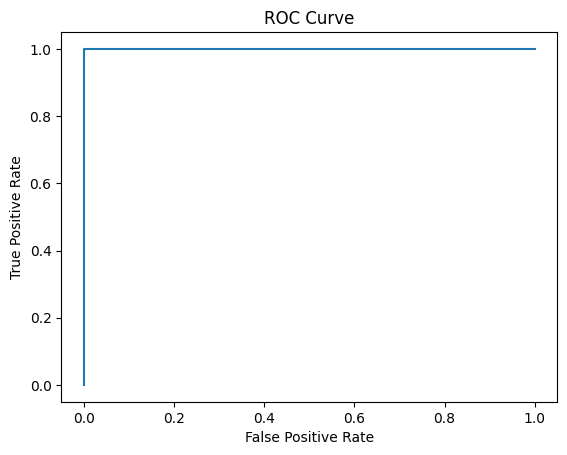

In [27]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Example ground truth labels and predicted probabilities
y_true = [1, 0, 1, 1, 0]
y_pred_prob = [0.8, 0.6, 0.9, 0.7, 0.5]

# Calculate TPR, FPR, and thresholds
fpr, tpr, thresholds = roc_curve(y_true, y_pred_prob)

# Plot ROC curve
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()


In [28]:
from sklearn.metrics import accuracy_score

def calculate_accuracy(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    return accuracy

In [29]:
y_true = [1]
y_pred = [1]

accuracy = calculate_accuracy(y_true, y_pred)
print("Accuracy:", accuracy)


Accuracy: 1.0


In [30]:
img_size = 224
batch_size = 64
epochs = 15

max_seq_length = 20
num_features = 2048

In [31]:
def crop_center_square(frame):
    y,x = frame.shape[0:2]
    min_dim = min(y, x)
    start_x = (x // 2) - (min_dim // 2)
    start_y = (y // 2) - (min_dim // 2)
    return frame[start_y :start_y + min_dim, start_x : start_x + min_dim]


In [32]:
def load_video(path, max_frames=0, resize=(img_size, img_size)):
    cap = cv2.VideoCapture(path)
    frames = []
    try:
        while 1:
            ret, frame = cap.read()
            if not ret:
                break
            frame = crop_center_square(frame)
            frame = cv2.resize(frame, resize)
            frame = frame[:, :, [2, 1, 0]]
            frames.append(frame)
            
            if len(frames) == max_frames:
                break
    finally:
        cap.release()
    return np.array(frames)

In [33]:
from tensorflow import keras


def pretrain_feature_extractor():
    feature_extractor = keras.applications.InceptionV3(
    weights = "imagenet",
    include_top=False,
    pooling="avg",
    input_shape = (img_size,img_size,3)
    )
    preprocess_input = keras.applications.inception_v3.preprocess_input
    
    inputs = keras.Input((img_size,img_size,3))
    preprocessed = preprocess_input(inputs)
    
    outputs = feature_extractor(preprocessed)
    return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = pretrain_feature_extractor()


In [34]:
def prepare_all_videos(df, root_dir): #df train_sample_metadata->json split
    num_samples = len(df)
    video_paths = list(df.index)
    labels = df["label"].values
    labels = np.array(labels=='FAKE').astype(np.int)
    
    frame_masks = np.zeros(shape=(num_samples, max_seq_length), dtype="bool")
    frame_features = np.zeros(
        shape=(num_samples, max_seq_length, num_features), dtype="float32"
    )
    
    for idx, path in enumerate(video_paths):
        frames = load_video(os.path.join(root_dir, path))
        frames = frames[None, ...]
        
        temp_frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
        temp_frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")
        for i, batch in enumerate(frames):
            video_length = batch.shape[0]
            length = min(max_seq_length, video_length)
            for j in range(length):
                temp_frame_features[i, j, :] =feature_extractor.predict(batch[None, j, :])
            temp_frame_mask[i, :length] =1 # 1 = not masked, 0 = masked
        
        frame_features[idx,] =temp_frame_features.squeeze()
        frame_masks[idx,] =temp_frame_mask.squeeze()
    
    return (frame_features, frame_masks), labels                           

In [35]:
from sklearn.model_selection import train_test_split

Train_set , Test_set = train_test_split(train_metadata, test_size=0.1,random_state=42,
                                       stratify=train_metadata['label'])
print(Train_set.shape, Test_set.shape)

(360, 3) (40, 3)


In [36]:
train_data, train_labels = prepare_all_videos(Train_set, "train")
test_data, test_labels = prepare_all_videos(Test_set, "test")

print(f"Frame features in train set:{train_data[0].shape}")
print(f"Frame masks in train set:{train_data[1].shape}")

C:\Users\pc\AppData\Local\Temp\ipykernel_12820\565336833.py:5: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  labels = np.array(labels=='FAKE').astype(np.int)


Frame features in train set:(360, 20, 2048)
Frame masks in train set:(360, 20)


In [37]:
from keras.layers import Input, SimpleRNN, Dense, Concatenate
from keras.models import Model

# Define input for frame features
frame_features_input = Input(shape=train_data[0].shape[1:], name='frame_features_input')

# Define input for frame masks
frame_masks_input = Input(shape=train_data[1].shape[1:], name='frame_masks_input')

# Define SimpleRNN layer with 128 units
rnn_layer = SimpleRNN(units=128)(frame_features_input)

# Concatenate the output of SimpleRNN with frame masks
concatenated = Concatenate()([rnn_layer, frame_masks_input])

# Add a fully connected layer with 64 units and ReLU activation
dense_layer = Dense(units=64, activation='relu')(concatenated)

# Add an output layer with 1 unit and sigmoid activation for binary classification
output_layer = Dense(units=1, activation='sigmoid')(dense_layer)

# Create the model with inputs and outputs
model = Model(inputs=[frame_features_input, frame_masks_input], outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(train_data, train_labels, epochs=10, batch_size=32, validation_split=0.1)

# Evaluate the model
loss, accuracy = model.evaluate(test_data, test_labels, batch_size=32)
print(f'Test Loss: {loss}, Test Accuracy: {accuracy}')


Epoch 1/10
11/11 [==============================] - 3s 69ms/step - loss: 0.6917 - accuracy: 0.7500 - val_loss: 0.6889 - val_accuracy: 0.8889
Epoch 2/10
11/11 [==============================] - 0s 36ms/step - loss: 0.6885 - accuracy: 0.7994 - val_loss: 0.6847 - val_accuracy: 0.8889
Epoch 3/10
11/11 [==============================] - 0s 37ms/step - loss: 0.6854 - accuracy: 0.7994 - val_loss: 0.6807 - val_accuracy: 0.8889
Epoch 4/10
11/11 [==============================] - 0s 37ms/step - loss: 0.6822 - accuracy: 0.7994 - val_loss: 0.6768 - val_accuracy: 0.8889
Epoch 5/10
11/11 [==============================] - 0s 35ms/step - loss: 0.6793 - accuracy: 0.7994 - val_loss: 0.6727 - val_accuracy: 0.8889
Epoch 6/10
11/11 [==============================] - 0s 42ms/step - loss: 0.6763 - accuracy: 0.7994 - val_loss: 0.6689 - val_accuracy: 0.8889
Epoch 7/10
11/11 [==============================] - 0s 44ms/step - loss: 0.6734 - accuracy: 0.7994 - val_loss: 0.6652 - val_accuracy: 0.8889
Epoch 8/10
11

In [38]:
loss, accuracy = model.evaluate(test_data, test_labels)

2/2 [==============================] - 0s 7ms/step - loss: 0.6632 - accuracy: 0.8000


In [39]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(train_sample_folder, test_folder))), columns=['video'])

In [40]:
def prepare_single_video(frames):
    frames = frames[None, ...]
    frame_mask = np.zeros(shape=(1, max_seq_length,), dtype="bool")
    frame_features = np.zeros(shape=(1, max_seq_length, num_features), dtype="float32")

    for i, batch in enumerate(frames):
        video_length = batch.shape[0]
        length = min(max_seq_length, video_length)
        for j in range(length):
            frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
        frame_mask[i, :length] = 1  # 1 = not masked, 0 = masked

    return frame_features, frame_mask


def sequence_prediction(path):
    frames = load_video(os.path.join(train_sample_folder, test_folder,path))
    frame_features, frame_mask = prepare_single_video(frames)
    return model.predict([frame_features, frame_mask])[0]

In [41]:
#To visualize
def to_gif(images):
    converted_images = images.astype(np.uint8)
    imageio.mimsave("animation.gif", converted_images, fps=10)
    return embed.embed_file("animation.gif")

In [42]:
test_video = np.random.choice(test_videos["video"].values.tolist())
print(f"Test video path: {test_video}")

if(sequence_prediction(test_video)>=0.7):
    print(f'The predicted class of the video is FAKE')
else:
    print(f'The predicted class of the video is REAL')


Test video path: lujvyveojc.mp4
1/1 [==============================] - 0s 163ms/step
The predicted class of the video is REAL
